# Remaking the trace dataframes

This is useful if you have added manual ids or otherwise changed the trace extraction settings, and want to reproduce the relevant plots

These functions will not reproduce anything but the .h5 files for traces, so for example reindex_masks.zarr.zip will remain the same

In [1]:

%load_ext autoreload
%autoreload 2

In [10]:
from wbfm.utils.projects.finished_project_data import ProjectData
from wbfm.utils.general.utils_paper import apply_figure_settings
import plotly.express as px
from wbfm.utils.visualization.plot_traces import make_default_summary_plots_using_config

# Step 1: using my project class

Note: you will need to update the path if you are not on the cluster. If you have /scratch mounted, this might work:

fname = "Z:/neurobiology/zimmer/fieseler/wbfm_projects/2022-11-27_spacer_7b_2per_agar/ZIM2165_Gcamp7b_worm1-2022_11_28/project_config.yaml"

In [12]:
# Use a project with external stimulus as an additional behavior annotation
fname = "/lisc/scratch/neurobiology/zimmer/fieseler/wbfm_projects_future/samuel_data/projects/184-004/project_config.yaml"
project_data_gcamp = ProjectData.load_final_project_data_from_config(fname)

ConfigFile  : WARNING  Could not find file None; Using hardcoded default raw data config: {'num_z_planes': 22, 'flyback_saved': False, 'num_flyback_planes_discarded': 2, 'z_step_size': 1.5, 'laser_561': 260, 'laser_488': 985, 'exposure_time': 12, 'agar': 2, 'recording_length_minutes': 8, 'ventral': 'left', 'strain': 'ZIM2165'}


ConfigFile  : INFO     =======================================
Project data for directory:
/lisc/scratch/neurobiology/zimmer/fieseler/wbfm_projects_future/samuel_data/projects/184-004 
With raw data in directory:
None 
See self.worm_posture_class for information on behavioral parameters
Found the following data files:
============Preprocessed Videos========
red_data:                 True
green_data:               True
============Segmentation===============
raw_segmentation:         True
colored_segmentation:     True
============Tracking===================
tracklets:                False
final_tracks:             False
manual_tracking:          True
============Traces=====================
traces:                   True




# Step 2: Clear the cache

For most people the tracking will remain the same, and only the traces will change

In [13]:
project_data_gcamp.data_cacher.clear_disk_cache(delete_invalid_indices=False, delete_traces=True)

Deleting /lisc/scratch/neurobiology/zimmer/fieseler/wbfm_projects_future/samuel_data/projects/184-004/.cache/paper_traces.h5
Deleting /lisc/scratch/neurobiology/zimmer/fieseler/wbfm_projects_future/samuel_data/projects/184-004/.cache/paper_traces_r20.h5
Deleting /lisc/scratch/neurobiology/zimmer/fieseler/wbfm_projects_future/samuel_data/projects/184-004/.cache/paper_traces_red.h5
Deleting /lisc/scratch/neurobiology/zimmer/fieseler/wbfm_projects_future/samuel_data/projects/184-004/.cache/paper_traces_green.h5
Deleting /lisc/scratch/neurobiology/zimmer/fieseler/wbfm_projects_future/samuel_data/projects/184-004/.cache/paper_traces_no_interpolation.h5
Deleting /lisc/scratch/neurobiology/zimmer/fieseler/wbfm_projects_future/samuel_data/projects/184-004/.cache/paper_traces_residual.h5
Deleting /lisc/scratch/neurobiology/zimmer/fieseler/wbfm_projects_future/samuel_data/projects/184-004/.cache/paper_traces_global.h5
Deleting /lisc/scratch/neurobiology/zimmer/fieseler/wbfm_projects_future/samue

# Step 3: Remake the traces and plots

In [14]:
all_dfs = project_data_gcamp.calc_all_paper_traces()
print(len(all_dfs))

8


ConfigFile  : INFO     Making default grid plots
ConfigFile  : WARNING  behavior_fname search failed; All calculations with curvature (kymograph) will fail


ConfigFile  : INFO     Found 84 neurons; shaping to grid of shape (17, 5)


0it [00:00, ?it/s]

ConfigFile  : INFO     Saving at local path: 4-traces/red_integration-grid-.h5


ConfigFile  : INFO     Found 84 neurons; shaping to grid of shape (17, 5)


0it [00:00, ?it/s]

ConfigFile  : INFO     Saving at local path: 4-traces/green_integration-grid-.h5


ConfigFile  : INFO     Found 84 neurons; shaping to grid of shape (17, 5)


0it [00:00, ?it/s]

ConfigFile  : INFO     Saving at local path: 4-traces/ratio_integration_outliers_removed_rolling_mean-grid-.h5


/home/charles/anaconda3/envs/wbfm/lib/python3.8/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


ConfigFile  : WARNING  min_nonnan was passed, but neuron_names was also passed. Ignoring min_nonnan
ConfigFile  : INFO     Found 76 neurons; shaping to grid of shape (16, 5)


0it [00:00, ?it/s]

ConfigFile  : INFO     Saving at local path: 4-traces/ratio_integration_rolling_mean_beh_pc1-grid-.h5


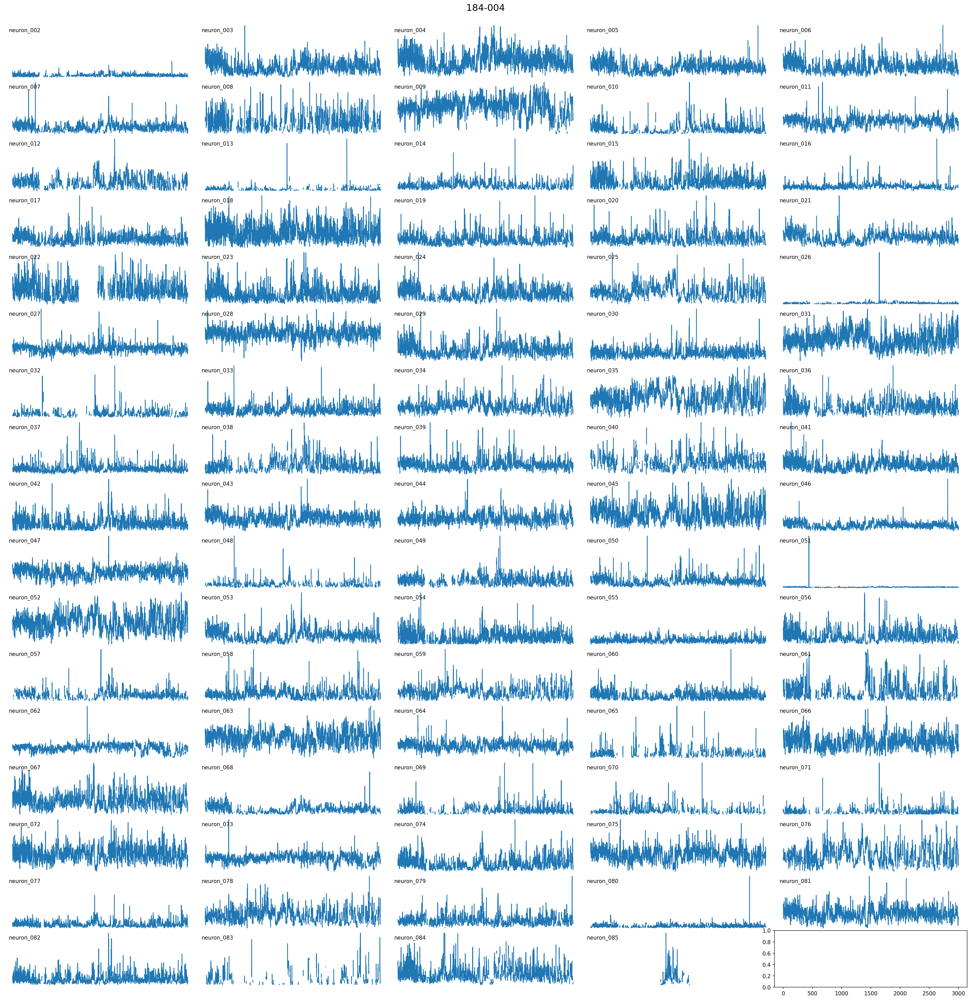

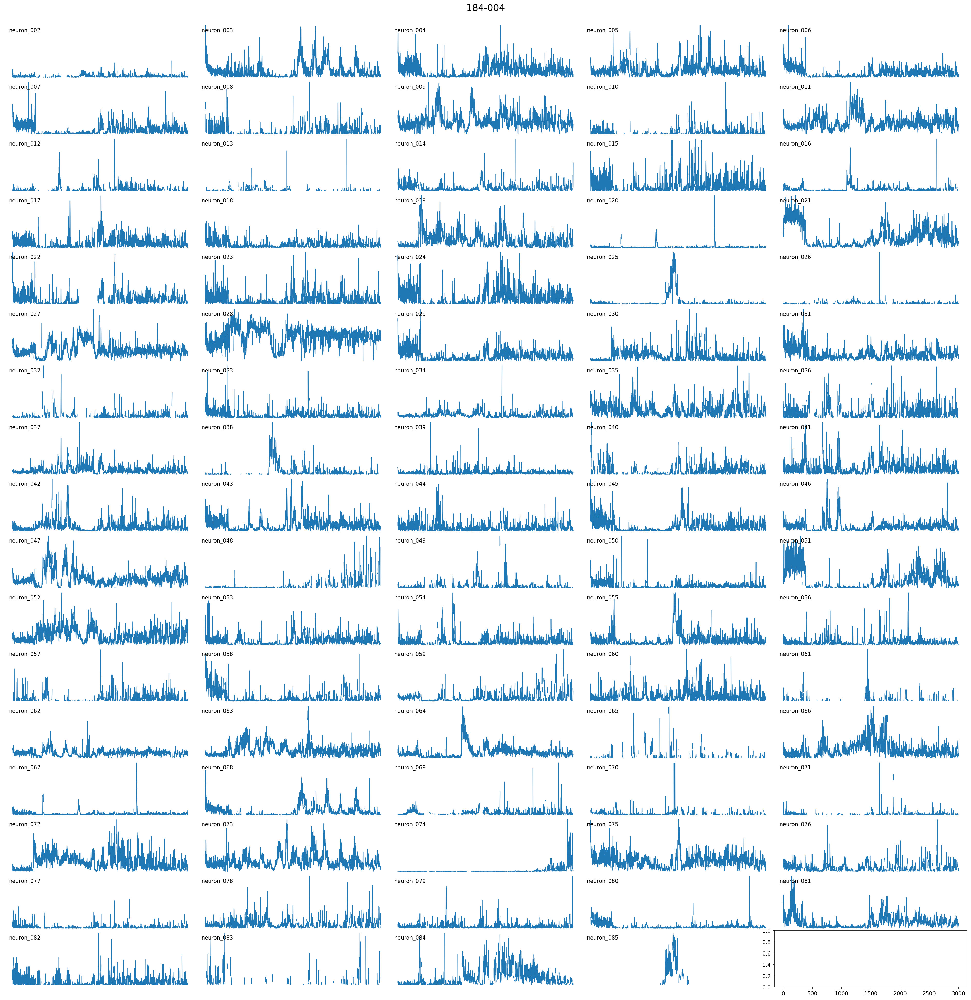

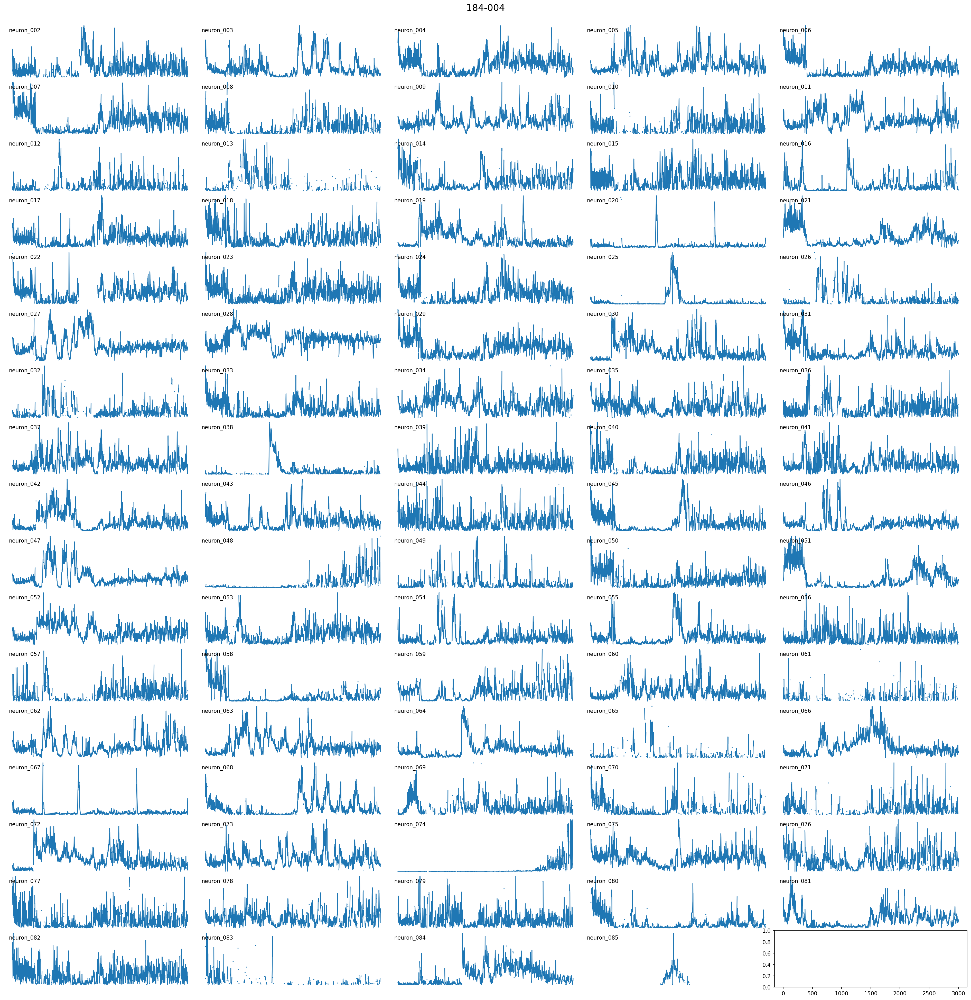

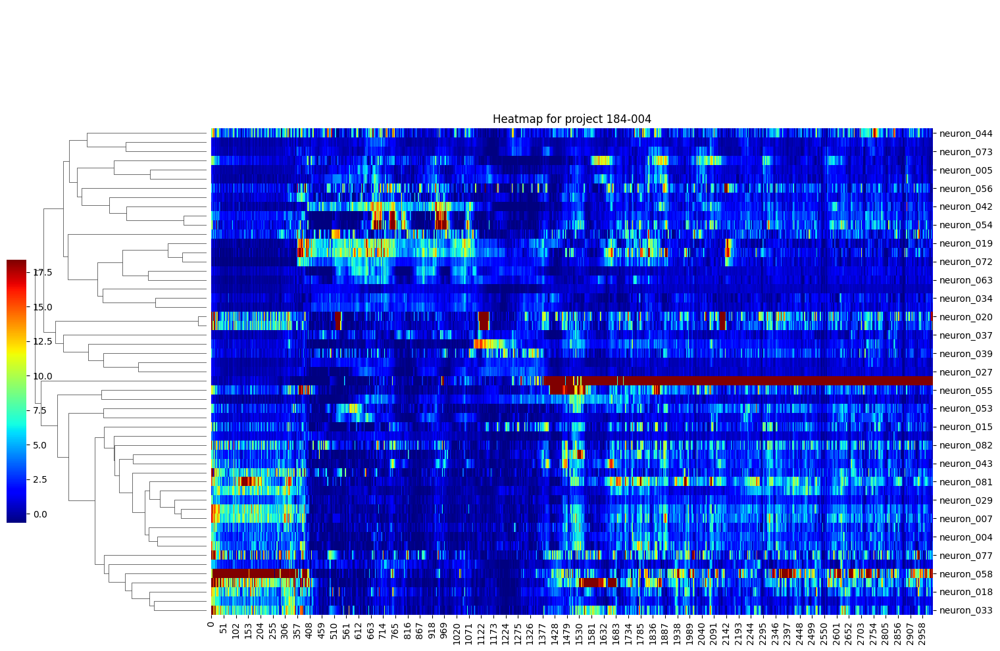

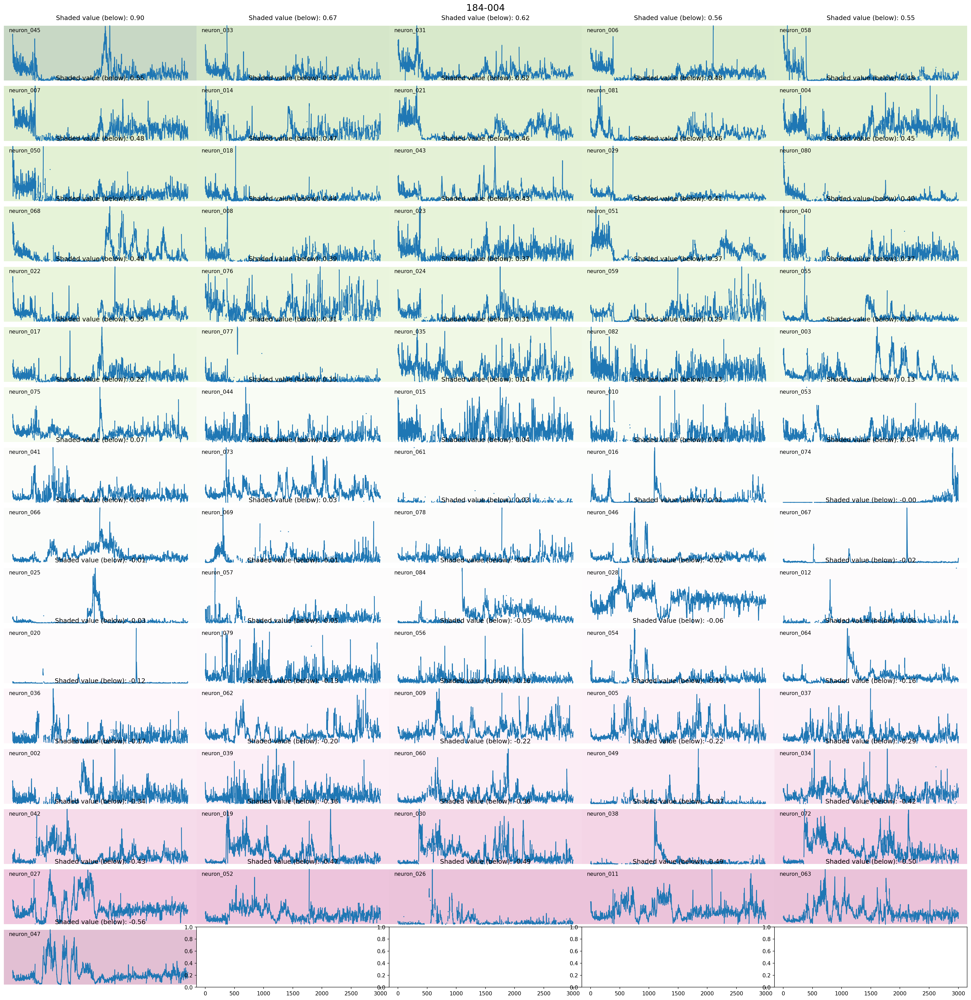

In [15]:
make_default_summary_plots_using_config(project_data_gcamp)